In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os
from lib_for_growth_model import *
from decimal import Decimal
import numpy as np
from scipy.stats import gaussian_kde
from pandas_helper import *

In [3]:
from pandas.io import wb

In [4]:
codes = read_csv('wbccodes2014.csv')

In [5]:
ini_data = pd.read_csv("ini_data_info_may14.csv")

In [6]:
def correct_countrycode(countrycode):
    '''
    Corrects countrycodes in the database that don't correspond to official 3 letters codes.
    '''
    if countrycode=='TMP':
        countrycode='TLS'
    if countrycode=='ZAR':
        countrycode='COD'
    if countrycode=='ROM':
        countrycode='ROU'
    return countrycode

In [7]:
codes['country'] = codes.country.apply(correct_countrycode)

In [8]:
nameofthisround = 'sept2016_4'

In [9]:
model = os.getcwd()
bau_folder   = "{}/baselines_{}/".format(model,nameofthisround)
cc_folder    = "{}/with_cc_{}/".format(model,nameofthisround)

In [10]:
list_bau = os.listdir(bau_folder)
list_cc  = os.listdir(cc_folder)

bau = pd.DataFrame()
cc  = pd.DataFrame()

for file in list_bau:
    bau = bau.append(pd.read_csv(bau_folder+file).drop('Unnamed: 0',axis=1))
    
for file in list_cc:
    cc = cc.append(pd.read_csv(cc_folder+file).drop('Unnamed: 0',axis=1))

C:\Miniconda3\lib\site-packages\pandas\io\parsers.py:1170: DtypeWarning: Columns (6,7,8,9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  data = self._reader.read(nrows)


In [11]:
bau = bau.drop_duplicates(['country', 'scenar', 'ssp'])
cc = cc.dropna()
bau = bau.dropna()

In [12]:
cc['issp5'] = cc.ssp=='ssp5'
bau['issp5'] = bau.ssp=='ssp5'

In [13]:
bau['countryname'] = bau.country.replace(codes.set_index('country').country_name)

In [14]:
cc['countryname'] = cc.country.replace(codes.set_index('country').country_name)

In [15]:
ini_data['countryname'] = ini_data.countrycode.replace(codes.set_index('country').country_name)

In [16]:
gni = wb.download(indicator='NY.GNP.PCAP.PP.CD',start=2015,end=2015,country='all').reset_index().rename(columns={'NY.GNP.PCAP.PP.CD':'gni'})

In [17]:
cc['inigdppc'] = cc.countryname.replace(gni.set_index('country').gni)

In [18]:
cc['inigdp_survey'] = cc.countryname.replace(ini_data.set_index('countryname').gdp)
cc['inigdppc_survey'] = cc.countryname.replace(ini_data.set_index('countryname').gdppc)

In [19]:
cc['ini_poor'] = cc.countryname.replace(ini_data.set_index('countryname').below125)
cc['ini_pop']  = cc.countryname.replace(ini_data.set_index('countryname').tot_pop)

In [20]:
hop = cc.dropna().set_index(['countryname', 'scenar', 'ssp','ccint'])
hip = broadcast_simple(bau.dropna().set_index(['countryname', 'scenar', 'ssp']),\
                       hop.index)

In [21]:
diff_poor_ag = (hop['belowpovline']-hip['belowpovline']).sum(level=['ccint','ssp','scenar'])

In [22]:
diff_poor = (hop['belowpovline']-hip['belowpovline'])
diff_poor_pc = (hop['belowpovline']-hip['belowpovline'])/hop['tot_pop']
diff_poor_pb = (hop['belowpovline']-hip['belowpovline'])/hip['belowpovline']

In [23]:
hop['inc20diffpc'] = (hop.incbott20-hip.incbott20)/hip.incbott20
hop['ginidiff'] = (hop.gini-hip.gini)
hop['diff_poor'] = diff_poor
hop['diff_poor_pc'] = diff_poor_pc

In [24]:
hop['incbott40diff'] = (hop.incbott40-hip.incbott40)/hip.incbott40
hop['avincomediff'] = (hop.avincome-hip.avincome)/hip.avincome

In [25]:
hop['GDPpcdiff'] = (hop.GDP/hop.tot_pop-hip.GDP/hip.tot_pop)/(hip.GDP/hip.tot_pop)
hop['GDPdiff'] = (hop.GDP-hip.GDP)

In [26]:
hop['GDPbau'] = hip.GDP
hop['poorbau'] = hip.belowpovline
hop['poorbaupc'] = hip.belowpovline/hip.tot_pop
hop['GDPpcbau'] = hip.GDP/hip.tot_pop

In [27]:
hop['growthpc_bau'] = (hop.GDPpcbau/hop.inigdppc_survey)**(1/(2030-2007))-1
hop['growthpc_cc'] = (hop.GDP/hop.tot_pop/hop.inigdppc_survey)**(1/(2030-2007))-1

In [28]:
hop['pov_reduc_bau'] = hop.ini_poor/hop.ini_pop-hop.belowpovline/hop.tot_pop

In [29]:
hop['wbregion']  = hop.country.replace(codes.set_index('country').wbregion)

In [33]:
hop['extr_poor_diff'] = (hop['belowpovline']-hip['belowpovline'])
hop['extr_poor_diff_pc_of_pop'] = (hop['belowpovline']-hip['belowpovline'])/hop['tot_pop']

In [35]:
hop = hop[hop.wbregion=="SAS"]

In [36]:
keep = hop[['year','extr_poor_diff','extr_poor_diff_pc_of_pop','incbott40diff', 'avincomediff']].reset_index().drop(['scenar','ssp','ccint'],axis=1)

In [40]:
save = keep[['extr_poor_diff','incbott40diff', 'avincomediff','countryname']].groupby(['countryname']).describe()

In [41]:
writer = pd.ExcelWriter('south_asia_ag_results.xlsx', engine='openpyxl')
save.to_excel(writer, 'Sheet1')
writer.save()

In [58]:
def find_range(x):
    df = pd.DataFrame(columns=['extr_poor_diff','incbott40diff', 'avincomediff'],index=x.countryname.unique())
    for var in df.columns:
        if x[var].max()>0:
            df[var] = "{} | {}".format(np.round(x[var].min(),2),np.round(x[var].max(),2))
        else:
            df[var] = "{} | {}".format(np.round(x[var].max(),2),np.round(x[var].min(),2))
    return df

In [61]:
def find_range(x):
    df = pd.DataFrame(columns=['extr_poor_diff','incbott40diff', 'avincomediff'],index=x.countryname.unique())
    for var in df.columns:
        if x[var].max()>0:
            df[var] = "{} | {}".format(np.round(np.percentile(x[var],5),2),np.round(np.percentile(x[var],95),2))
        else:
            df[var] = "{} | {}".format(np.round(np.percentile(x[var],95),2),np.round(np.percentile(x[var],5),2))
    return df

In [62]:
keep[['extr_poor_diff','incbott40diff', 'avincomediff','countryname']].groupby(['countryname']).apply(lambda x:find_range(x)).to_csv("for_note.csv")

In [29]:
from lib_for_plot import *
import seaborn as sns

sns.set_context("poster",rc={"font.size": 18})
sns.set_style("whitegrid")

:0: FutureWarning: IPython widgets are experimental and may change in the future.


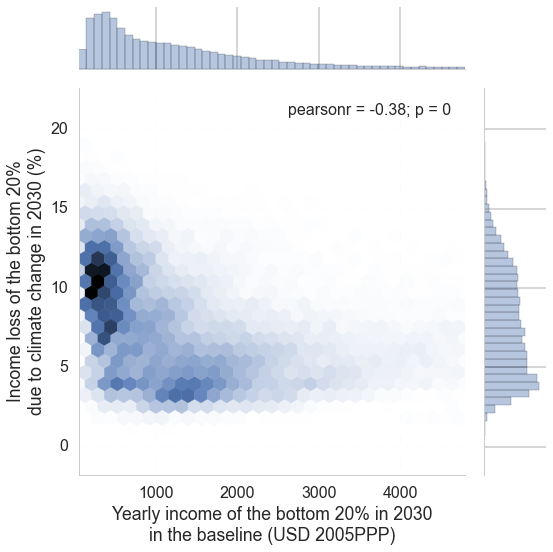

In [36]:
df = hop.drop(["Suriname"],level='countryname').drop(0,level='ccint')

ax = sns.jointplot(x=12*df.incbott20[df.incbott20<400],\
              y=-100*df.inc20diffpc[df.incbott20<400], kind="hex",gridsize=30,size=8)

ax.set_axis_labels('Yearly income of the bottom 20% in 2030\nin the baseline (USD 2005PPP)','Income loss of the bottom 20%\ndue to climate change in 2030 (%)')
savefig("graphs_sept2016/dens_incbott20_bau_increase_nov2016.png",bbox_inches="tight",dpi=300)

In [30]:
from scipy.interpolate import interp1d

In [31]:
def sample_output(var,countryname,ccint,rand):
    
    Z = hop[var].unstack("ccint").unstack("countryname")[ccint][countryname].values

    H,X1 = np.histogram( Z, bins = 500, normed = True )
    dx = X1[1] - X1[0]
    F1 = np.cumsum(H)*dx
    
    out = interp1d(F1,X1[1:], fill_value=F1[-1], bounds_error=False)(rand)
    return out

In [32]:
list_countries = hop.index.get_level_values('countryname').unique()

In [66]:
rand=np.random.rand(1*10**(5),len(list_countries))

In [67]:
def build_global_df(var,ccint):
    output_0 = pd.DataFrame(columns=list_countries)
    for (i,countryname) in enumerate(list_countries):
        output_0[countryname] = sample_output(var,countryname,ccint,rand[:,i])
    output = pd.DataFrame(output_0.sum(axis=1),columns=[var])
    output.index.name="scenar"
    output['ccint'] = ccint
    return output

In [68]:
a = pd.concat([build_global_df('GDPdiff',0),build_global_df('GDPdiff',1)],axis=0)

In [69]:
b = pd.concat([build_global_df('diff_poor',0),build_global_df('diff_poor',1)],axis=0)

In [70]:
world = pd.concat([a,b.drop("ccint",axis=1)],axis=1)

In [71]:
world.diff_poor.describe()

count    2.000000e+05
mean     6.342218e+07
std      2.634983e+07
min      1.578092e+07
25%      3.857629e+07
50%      5.779996e+07
75%      8.550182e+07
max      1.656897e+08
Name: diff_poor, dtype: float64

In [72]:
world.sample(3)

,GDPdiff,ccint,diff_poor
scenar,,,
53473,-9.998986e+10,1,87665423.618578
20073,-3.798033e+10,0,44028015.777350
38119,-3.600769e+10,0,42717209.101594


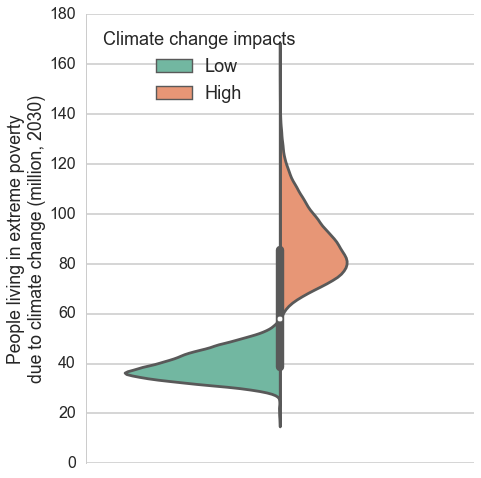

In [86]:
font = {'family' : 'sans serif',
    'size'   : 18}
plt.rc('font', **font)

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)

to_plot = world[["diff_poor","ccint"]].replace(dict({0:'Low',1:'High'})).copy()
to_plot.diff_poor = 10**(-6)*to_plot.diff_poor
to_plot['prout']=""

sns.violinplot(x='prout',y='diff_poor',data=to_plot,hue='ccint',split=True,ax=ax,palette="Set2")
ax.legend(title="Climate change impacts",prop=font,loc=2)
sns.despine(bottom=True)
plt.ylabel("People living in extreme poverty\ndue to climate change (million, 2030)")
plt.xlabel("")
ax.get_xaxis().set_ticks([])
#plt.title(country)
spine_and_ticks(ax)
savefig("graphs_sept2016/global_poor.png",bbox_inches="tight",dpi=300)

In [30]:
from scipy import stats

In [31]:
import statsmodels.api as sm

In [89]:
X = 100*hop.drop(0,level='ccint').drop("Burundi",level='countryname').growthpc_bau
X1 = sm.add_constant(X)
Y = 100*hop.drop(0,level='ccint').drop("Burundi",level='countryname').diff_poor_pc
W = hop.drop(0,level='ccint').drop("Burundi",level='countryname').tot_pop
mod = sm.WLS(Y, X1, weights=W,hasconst=True).fit()

slope = mod.params.growthpc_bau
const = mod.params.const

In [90]:
mod.params

const           2.859086
growthpc_bau   -0.245646
dtype: float64

In [91]:
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:           diff_poor_pc   R-squared:                       0.202
Model:                            WLS   Adj. R-squared:                  0.202
Method:                 Least Squares   F-statistic:                 1.243e+04
Date:                Mon, 03 Oct 2016   Prob (F-statistic):               0.00
Time:                        09:28:55   Log-Likelihood:            -5.2638e+05
No. Observations:               49200   AIC:                         1.053e+06
Df Residuals:                   49198   BIC:                         1.053e+06
Df Model:                           1                                         
================================================================================
                   coef    std err          t      P>|t|      [95.0% Conf. Int.]
--------------------------------------------------------------------------------
const            2.8591      0.014    210.233      0.000         2.832     2.886
growthpc_bau    -0.2456      0.002   -111.485      0.000        -0.250    -0.241
==============================================================================
Omnibus:                    35196.773   Durbin-Watson:                   0.844
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1667218.200
Skew:                           2.926   Prob(JB):                         0.00
Kurtosis:                      30.911   Cond. No.                         15.0
==============================================================================
"""

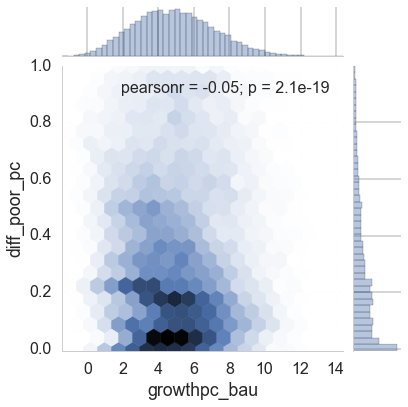

In [92]:
sns.jointplot(X[Y<1],Y[Y<1],kind='hex',gridsize=20)

In [224]:
from scipy.stats.stats import pearsonr

In [305]:
pearsonr(X,Y)

(0.10615545415917994, 1.5319758453169855e-241)

In [32]:
X = -100*hop.drop("Suriname",level='countryname').avincomediff
Y = -100*hop.drop("Suriname",level='countryname').incbott40diff
W = hop.drop("Suriname",level='countryname').tot_pop
mod = sm.WLS(Y, X, weights=W).fit()

In [94]:
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:          incbott40diff   R-squared:                       0.960
Model:                            WLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 2.390e+06
Date:                Mon, 03 Oct 2016   Prob (F-statistic):               0.00
Time:                        09:29:26   Log-Likelihood:            -1.0548e+06
No. Observations:               98400   AIC:                         2.110e+06
Df Residuals:                   98399   BIC:                         2.110e+06
Df Model:                           1                                         
================================================================================
                   coef    std err          t      P>|t|      [95.0% Conf. Int.]
--------------------------------------------------------------------------------
avincomediff     1.6790      0.001   1546.066      0.000         1.677     1.681
==============================================================================
Omnibus:                    73999.836   Durbin-Watson:                   0.846
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          5264695.098
Skew:                           3.025   Prob(JB):                         0.00
Kurtosis:                      38.320   Cond. No.                         1.00
==============================================================================
"""

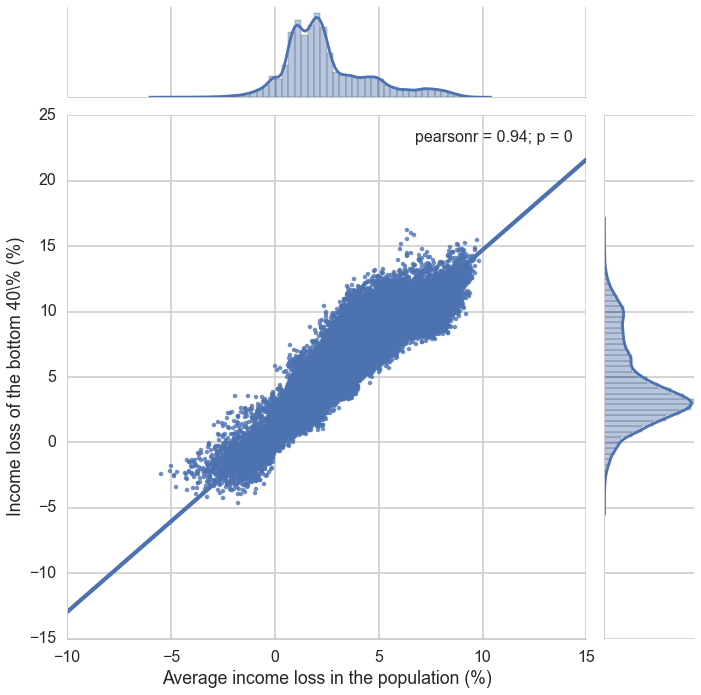

In [95]:
p = sns.jointplot(X,Y,kind='reg',size=10)
p.set_axis_labels("Average income loss in the population (%)",\
                  "Income loss of the bottom 40\% (%)")

In [34]:
slope = mod.params.avincomediff

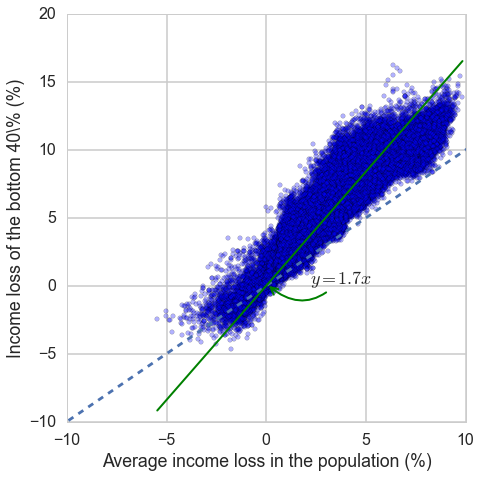

In [35]:
plt.figure(figsize=(7,7))
plt.scatter(X,Y,alpha=0.3)
plt.plot([-15,15],[-15,15],'--')
plt.plot(np.unique(X),slope*np.unique(X),linewidth=2,color="green")
plt.xlabel("Average income loss in the population (%)")
plt.ylabel("Income loss of the bottom 40\% (%)")
axes = plt.gca()
axes.set_xlim([-10,10])
axes.set_ylim([-10,20])

x0 = 0.05
y0 = slope*x0
plt.annotate("$y = {}x$".format(np.round(slope,1)),\
             xy=(x0, y0), xytext=(2.2, y0+1.2*y0),fontsize=18,\
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=-0.5',linewidth=2,color="green"))

plt.tight_layout()
savefig("graphs_sept2016/inequality_nov2016.png",bbox_inches="tight",dpi=300)

In [33]:
hop.ix[hop.avincomediff<hop.incbott40diff,:].reset_index().countryname.value_counts();

In [52]:
-100*hop.drop("Suriname",level='countryname').GDPpcdiff.sample(3)

countryname       scenar  ssp   ccint
Congo, Dem. Rep.  254     ssp4  0        0.175480
Togo              266     ssp4  1        0.369380
China             93      ssp5  1        1.106422
Name: GDPpcdiff, dtype: float64

In [103]:
hop[hop.inigdppc=="Cape Verde"].inigdppc;

In [48]:
ccint_describe=pd.DataFrame(index=[0,1],columns=['string'])
ccint_describe.loc[0,'string']="Low"
ccint_describe.loc[1,'string']="High"

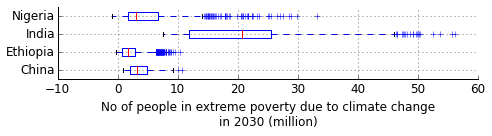

In [111]:
font = {'family' : 'sans serif',
    'size'   : 12}
plt.rc('font', **font)

tt = (diff_poor.dropna().max(level='countryname')>=10*10**(6))

s = 0.5*len(list(tt[tt].index))

fig = plt.figure(figsize=(7,s))
ax = fig.add_subplot(111)

to_plot = 10**(-6)*diff_poor.unstack('countryname')[list(tt[tt].index)]
ax = to_plot.boxplot(return_type='axes',ax=ax,vert=0)
plt.xlabel("No of people in extreme poverty due to climate change\nin 2030 (million)")
spine_and_ticks(ax)
savefig("poor_by_country_high.png",bbox_inches="tight",dpi=300)

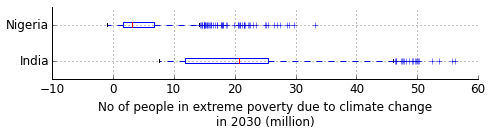

In [80]:
font = {'family' : 'sans serif',
    'size'   : 12}
plt.rc('font', **font)

fig = plt.figure(figsize=(7,2))
ax = fig.add_subplot(111)
to_plot = 10**(-6)*diff_poor.unstack('countryname')[["India","Nigeria"]]
ax = to_plot.boxplot(return_type='axes',ax=ax,vert=0)
plt.xlabel("No of people in extreme poverty due to climate change\nin 2030 (million)")
spine_and_ticks(ax)
savefig("poor_by_country_only_india_nigeria.png",bbox_inches="tight",dpi=300)

In [104]:
diff_poor.max(level='countryname').sum()*10**(-6)

262.71917946081629

In [105]:
diff_poor.min(level='countryname').sum()*10**(-6)

12.621825740456018

In [29]:
hop.reset_index().columns

Index(['countryname', 'scenar', 'ssp', 'ccint', 'GDP', 'avincome',
       'avincomeag', 'avincomenonag', 'b', 'below10', 'below125', 'below2',
       'below4', 'below6', 'below8', 'childrenag', 'childrenonag', 'country',
       'diarrhea_cursor', 'diarrhea_share', 'disasters_cursor',
       'drought_share', 'farmer_rev_change', 'flood_share_nonpoor',
       'flood_share_poor', 'food_cursor', 'fprice_increase', 'gap10', 'gap125',
       'gap2', 'gap4', 'gap6', 'gap8', 'gini', 'grag', 'grmanu', 'grserv',
       'inc2040', 'incbott10', 'incbott20', 'incbott40', 'incsharebott20ag',
       'incsharebott20nonag', 'malaria_cursor', 'malaria_share', 'p',
       'paramshstunt', 'peopleag', 'peoplenonag', 'poorag', 'poornonag',
       'prod_gr_ag', 'prod_gr_manu', 'prod_gr_serv', 'quintilecum1',
       'quintilecum2', 'quintilepc1', 'quintilepc2', 'shareag', 'shareemp',
       'sharemanu', 'skillpag', 'skillpmanu', 'skillpserv', 'surge_share',
       'temp_impact', 'tot_pop', 'transmission', 'wi

In [106]:
from lib_for_analysis import *

In [107]:
def anova_table(varin,data,experiments_cols):
    formula = varin+" ~ " + "+".join(experiments_cols)
    olsmodel=ols(formula,data=data).fit()
    table=anova_lm(olsmodel)
    table['sum_sq_pc']=table['sum_sq']/table['sum_sq'].sum()
    table=table.sort(['sum_sq'],ascending=False)
    return table['sum_sq_pc']

In [108]:
def drivers_matrix(var,hop,cc,myinputs):
    df = pd.DataFrame(index=cc.dropna().countryname.unique(),columns=myinputs+["Residual"])
    for countrycode in cc.dropna().countryname.unique():
        dataset = hop.reset_index().ix[hop.reset_index().countryname==countrycode,:]
        t = anova_table(var,dataset,myinputs)
        df.loc[countrycode,:]=t
    return df

In [109]:
myinputs = ['shareag','sharemanu', 'shareemp', 'grserv', 'grag', 'grmanu', 'skillpserv',\
       'skillpag', 'skillpmanu', 'p', 'b','ccint','issp5','voice']

In [110]:
drivers_country_poor_pc = drivers_matrix('diff_poor_pc',hop,cc,myinputs)
drivers_country_poor = drivers_matrix('diff_poor',hop,cc,myinputs)
drivers_country_incbott20 = drivers_matrix('inc20diffpc',hop,cc,myinputs)
drivers_country_gini = drivers_matrix('ginidiff',hop,cc,myinputs)

In [111]:
drivers_abs_poor = drivers_matrix('incbott20',hop,cc,myinputs)

In [112]:
drivers_abs_poor_baseline = drivers_matrix('incbott20',hip,cc,myinputs)

In [113]:
from random import shuffle

In [114]:
bb = dict({'shareag':'Share of workers in ag',\
                    'sharemanu':'Share of workers in manu',\
                    'shareemp':'Employment rate',\
                    'grserv':'Growth in services',\
                    'grag':'Growth in ag',\
                    'grmanu':'Growth in manu',\
                    'skillpserv':'Skill premium services',\
                    'skillpag':'Skill premium ag',\
                    'skillpmanu':'Skill premium manu',\
                    'p':'Pensions',\
                    'b':'Redistribution',\
                    'ccint':'Climate change impacts',\
                    'issp5':'Demographics',\
                    'voice':'Governance'  })

In [115]:
aa = dict({'shareag':'Share of workers in ag',\
                    'sharemanu':'Share of workers in manu',\
                    'shareemp':'Employment rate',\
                    'grserv':'Growth in services',\
                    'grag':'Growth in ag',\
                    'grmanu':'Growth in manu',\
                    'skillpserv':'Skill premium services',\
                    'skillpag':'Skill premium ag',\
                    'skillpmanu':'Skill premium manu',\
                    'p':'Pensions',\
                    'b':'Redistribution',\
                    'fprice_increase':'Food prices',\
                    'farmer_rev_change':'Farmers revenue change',\
                    'temp_impact':'Temperature',\
                    'paramshstunt':'Stunting',\
                    'malaria_cursor':'Malaria',\
                    'diarrhea_cursor':'Diarrhea',\
                    'disasters_cursor':'Disasters',\
                    'ssp':'Population',\
                    'voice':'Governance'  })

In [116]:
drivers_country_incbott20.columns

Index(['shareag', 'sharemanu', 'shareemp', 'grserv', 'grag', 'grmanu',
       'skillpserv', 'skillpag', 'skillpmanu', 'p', 'b', 'ccint', 'issp5',
       'voice', 'Residual'],
      dtype='object')

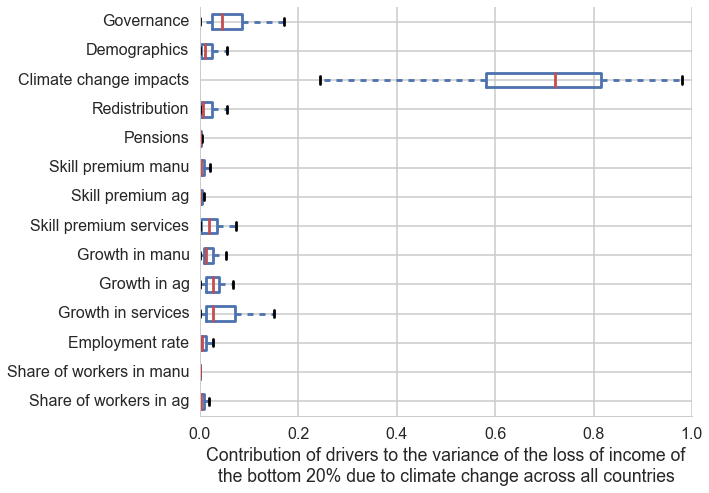

In [117]:
font = {'family' : 'sans serif',
    'size'   : 12}
plt.rc('font', **font)
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111)
drivers_country_incbott20.reset_index().drop(['index','Residual'],axis=1).rename(columns=bb).sort().plot(kind='box',vert=0,ax=ax)
plt.xlabel("Contribution of drivers to the variance of the loss of income of\nthe bottom 20% due to climate change across all countries")
spine_and_ticks(ax)
savefig("graphs_sept2016/drivers_incbott20diff.png",bbox_inches="tight",dpi=300)

In [118]:
drivers_country_incbott20['baseline']=drivers_country_incbott20[['shareag', 'sharemanu', 'shareemp', 'grserv', 'grag', 'grmanu',
       'skillpserv', 'skillpag', 'skillpmanu', 'p', 'b', 'issp5','voice']].sum(axis=1)
drivers_country_incbott20['bau-dominant']=drivers_country_incbott20.baseline>drivers_country_incbott20.ccint

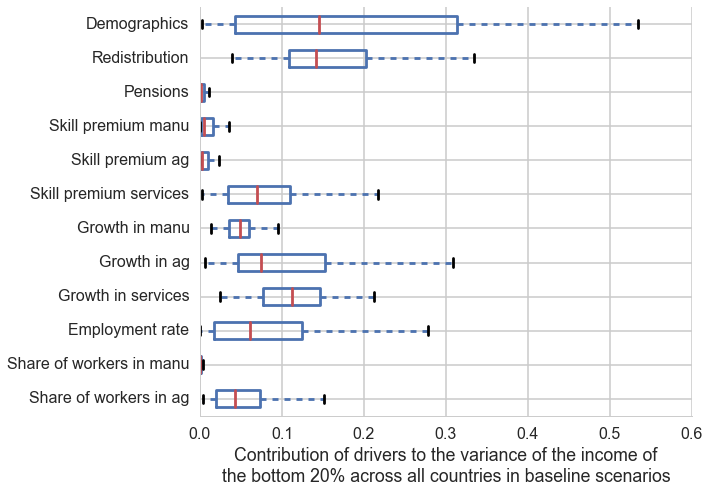

In [119]:
font = {'family' : 'sans serif',
    'size'   : 12}
plt.rc('font', **font)
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111)
drivers_abs_poor_baseline.reset_index().drop(['index','ccint','Residual','voice'],axis=1).rename(columns=bb).sort().plot(kind='box',vert=0,ax=ax)
plt.xlabel("Contribution of drivers to the variance of the income of\nthe bottom 20% across all countries in baseline scenarios")
spine_and_ticks(ax)
savefig("graphs_sept2016/drivers_bau.png",bbox_inches="tight",dpi=300)

In [122]:
import string

In [123]:
font = {'family' : 'sans serif',
    'size'   : 18}
plt.rc('font', **font)

In [124]:
sns.set_context("poster",rc={"font.size": 18})
sns.set_style("whitegrid")

In [125]:
p="Set2"

C:\Miniconda3\lib\site-packages\matplotlib\pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


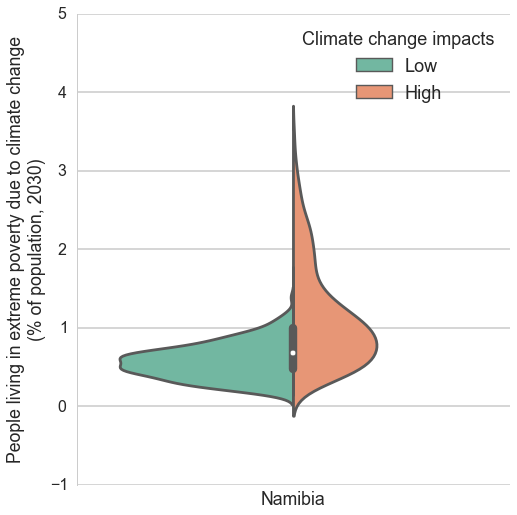

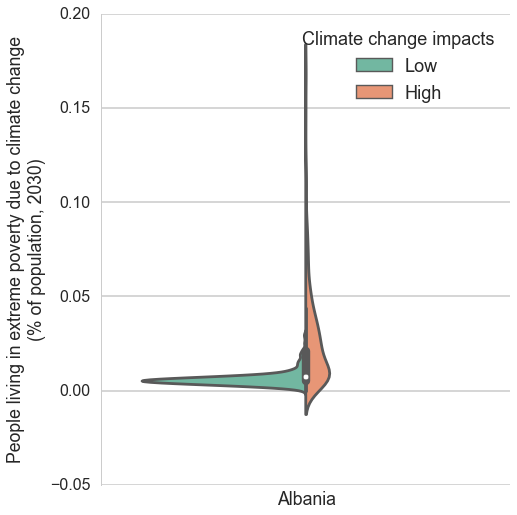

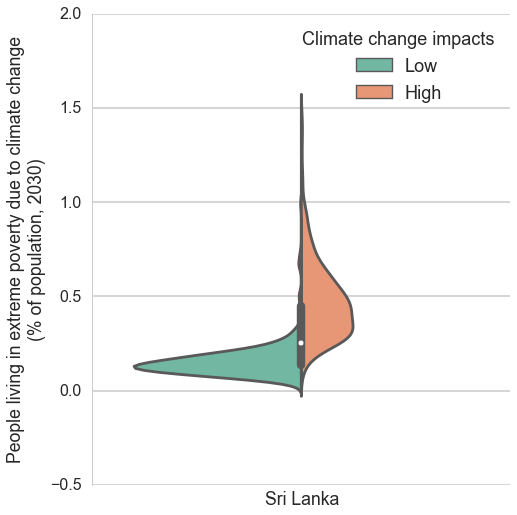

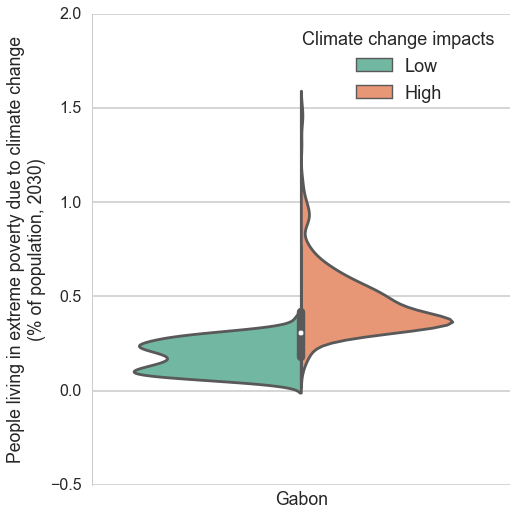

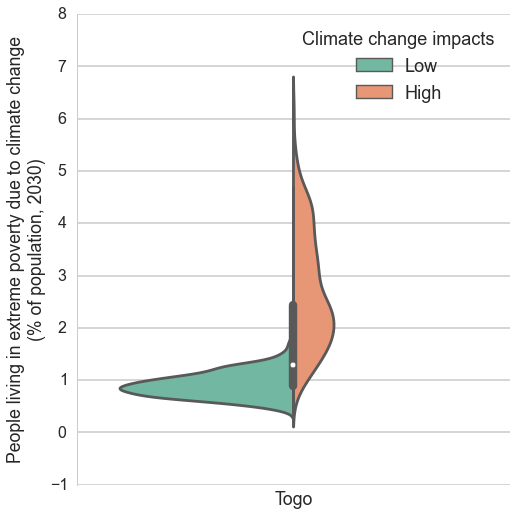

...

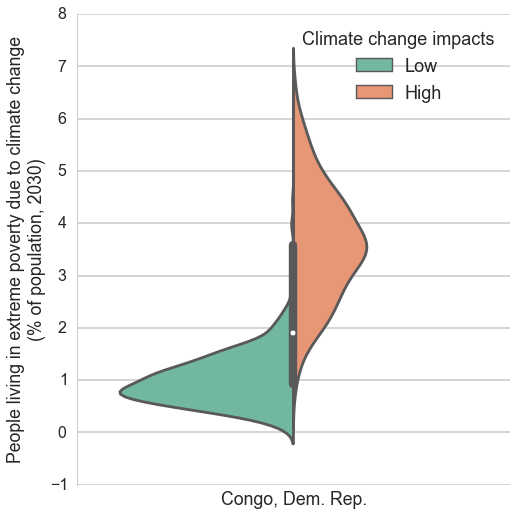

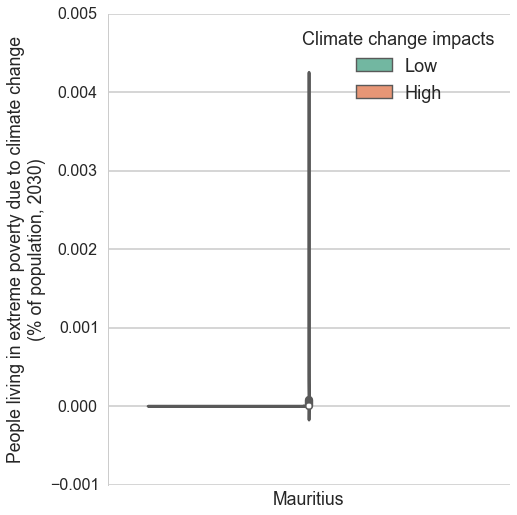

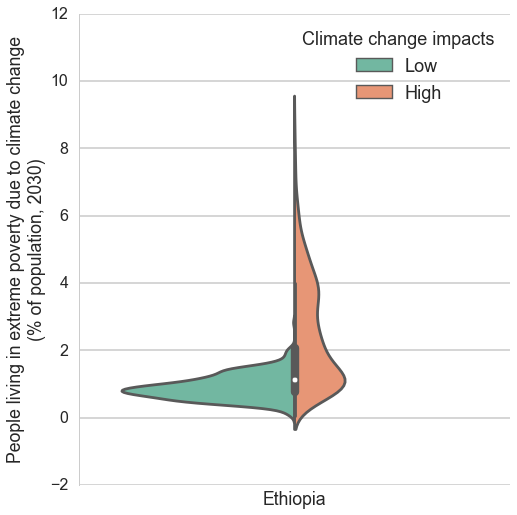

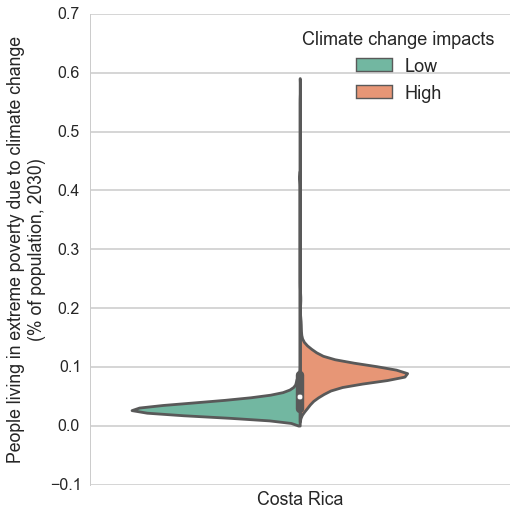

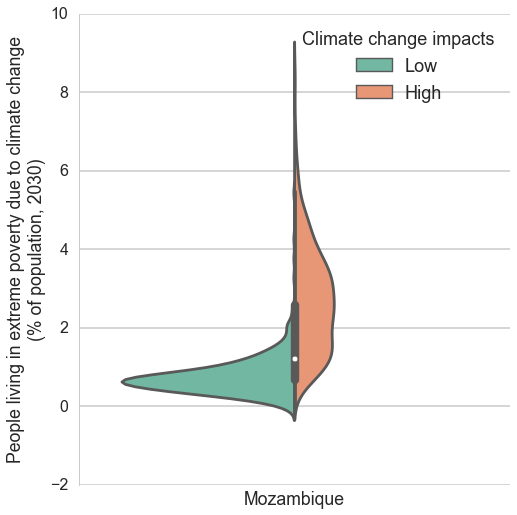

In [126]:
for country in drivers_country_poor_pc.index:

    fig = plt.figure(figsize=(7.5,7.5))
    ax = fig.add_subplot(111)

    to_plot = hop.reset_index().ix[hop.reset_index().countryname==country,:]
    to_plot.diff_poor_pc = 100*to_plot.diff_poor_pc
    
    to_plot = to_plot.rename(columns=aa)
    
    firstdriver = drivers_country_poor_pc.idxmax(axis=1).loc[country]
    
    to_plot["Climate change impacts"] = to_plot.ccint.replace(dict({0:'Low',1:'High'}))
    huedriver="Climate change impacts"

    sns.violinplot(x='countryname',y='diff_poor_pc',data=to_plot,hue=huedriver,split=True,ax=ax,palette=p)
    ax.legend(title=huedriver,prop=font,loc=0)
    sns.despine(bottom=True)
    plt.ylabel("People living in extreme poverty due to climate change\n(% of population, 2030)")
    plt.xlabel(country)
    ax.get_xaxis().set_ticks([])
    #plt.title(country)
    spine_and_ticks(ax)
    
    exclude = set(string.punctuation)
    s = ''.join(ch for ch in country if ch not in exclude)
    savefig("graphs_sept2016/{}.png".format(s),bbox_inches="tight",dpi=300)

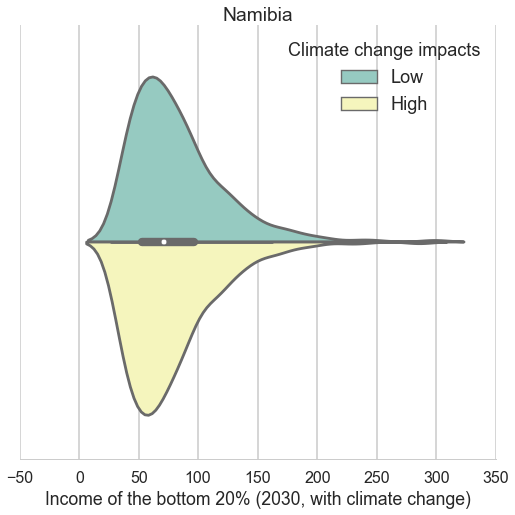

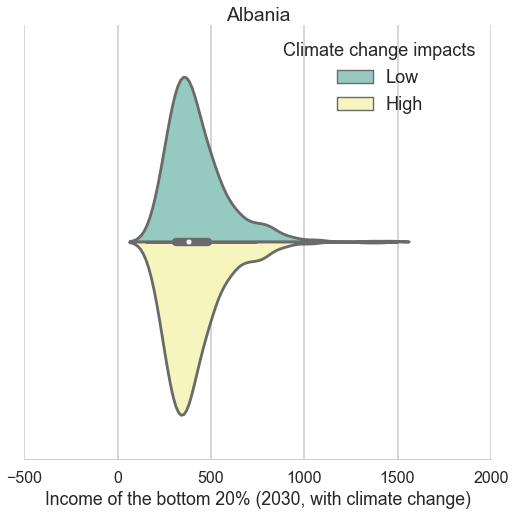

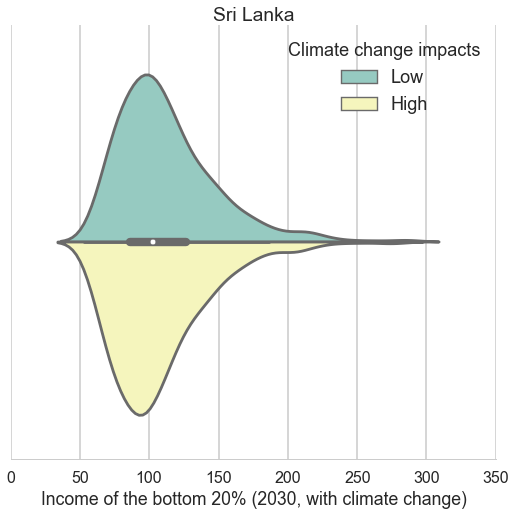

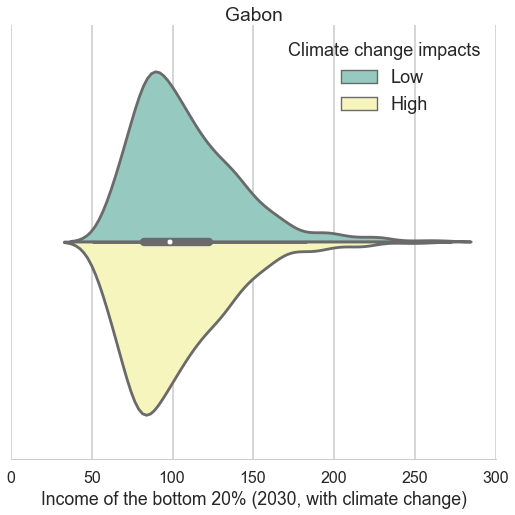

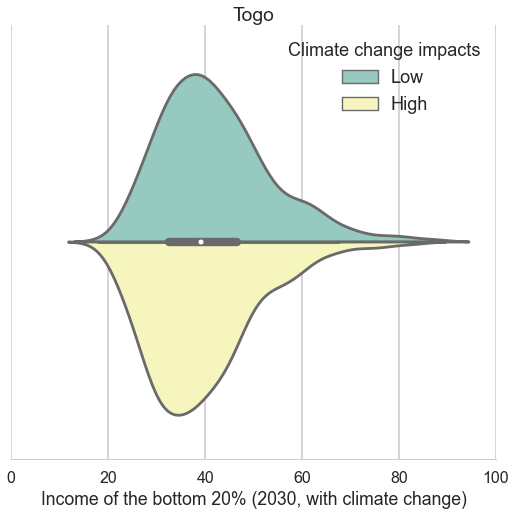

...

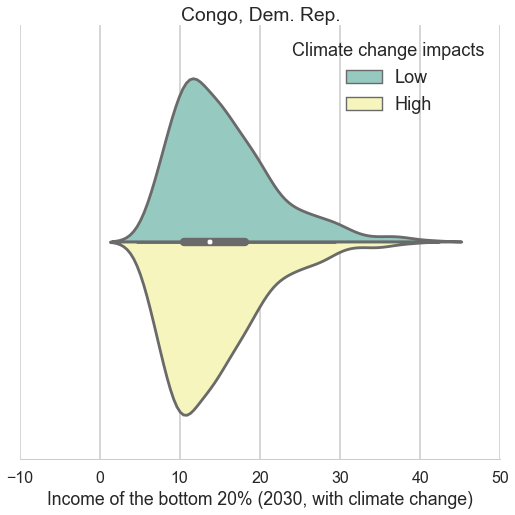

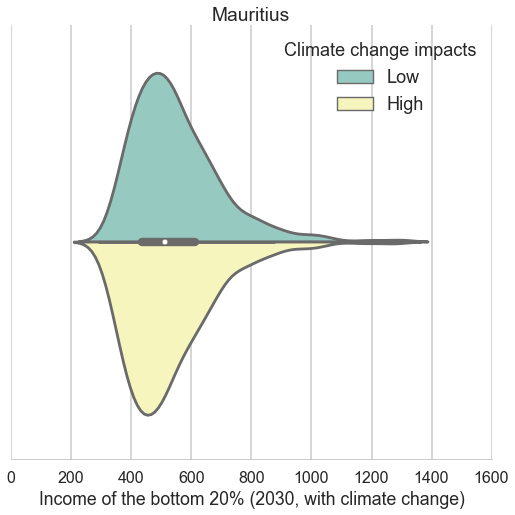

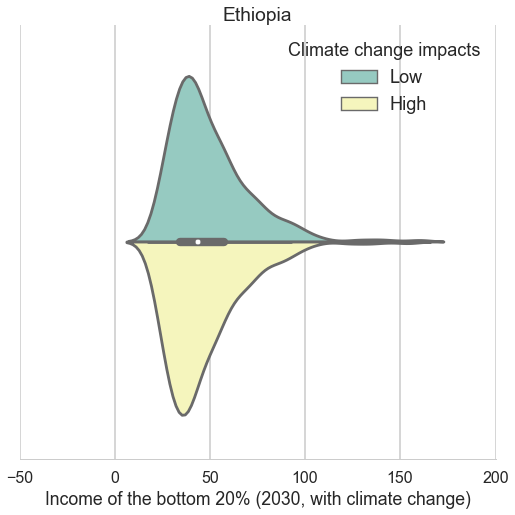

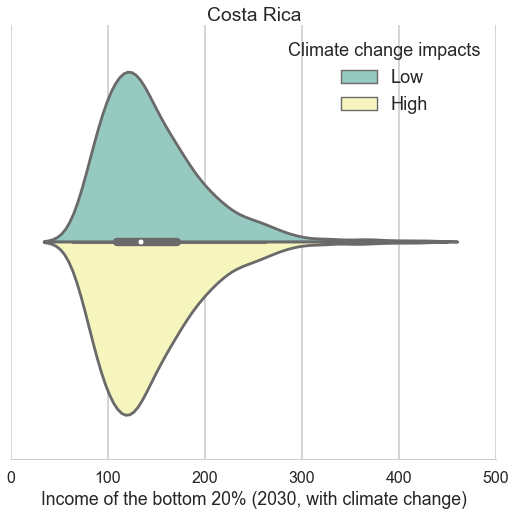

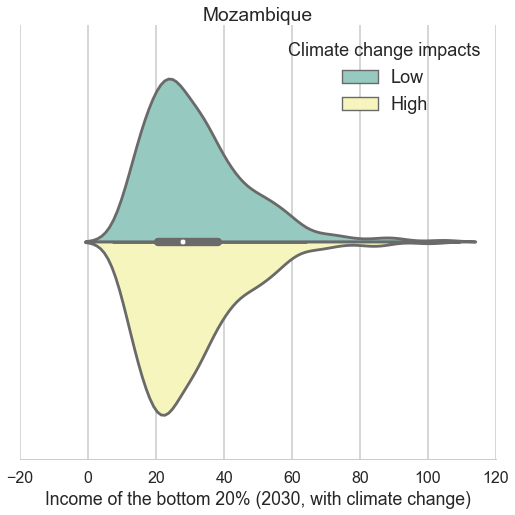

In [128]:
for country in drivers_abs_poor.index:

    fig = plt.figure(figsize=(7.5,7.5))
    ax = fig.add_subplot(111)

    to_plot = hop.reset_index().ix[hop.reset_index().countryname==country,:]    
    to_plot = to_plot.rename(columns=aa)
    
    to_plot["Climate change impacts"] = to_plot.ccint.replace(dict({0:'Low',1:'High'}))
    huedriver="Climate change impacts"
    
    p="Set3"

    sns.violinplot(y='countryname',x='incbott20',data=to_plot,hue=huedriver,split=True,ax=ax,palette=p)
    ax.legend(title=huedriver,prop=font,loc=0)
    sns.despine(left=True)
    plt.xlabel("Income of the bottom 20% (2030, with climate change)")
    plt.ylabel("")
    ax.get_yaxis().set_ticks([])
    plt.title(country)
    spine_and_ticks(ax)
    
    exclude = set(string.punctuation)
    s = ''.join(ch for ch in country if ch not in exclude)
    savefig("results_by_country/{}.png".format(s),bbox_inches="tight",dpi=300)

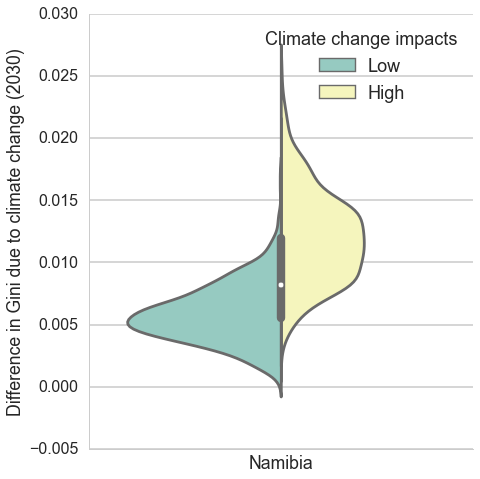

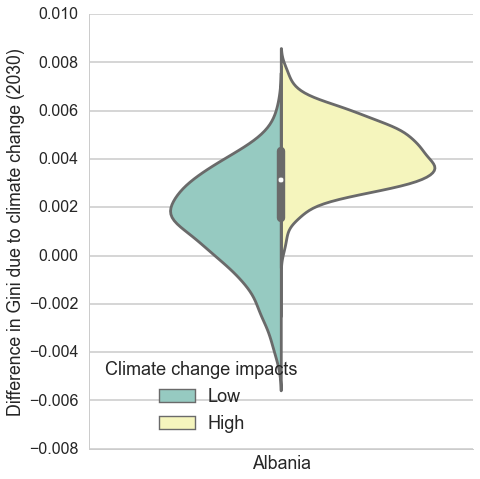

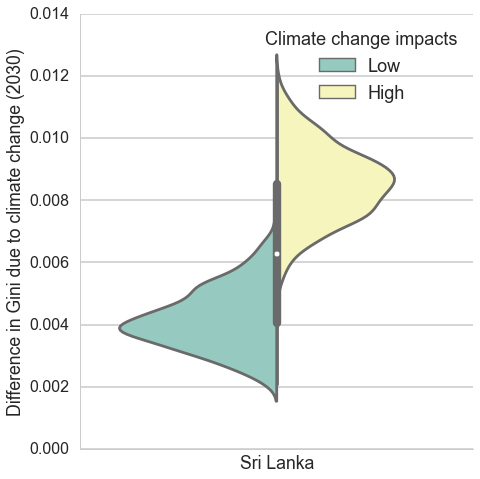

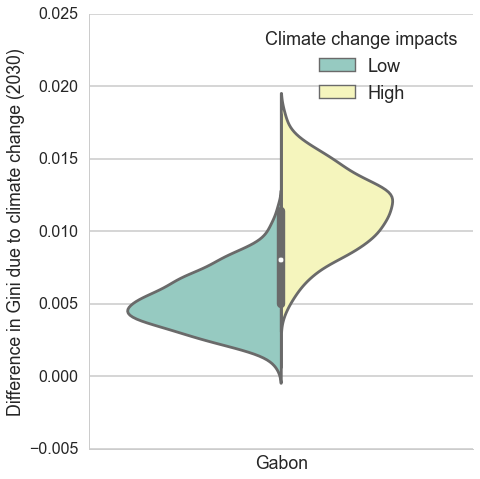

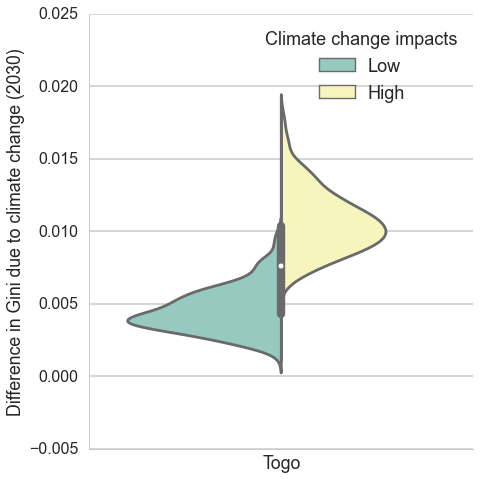

...

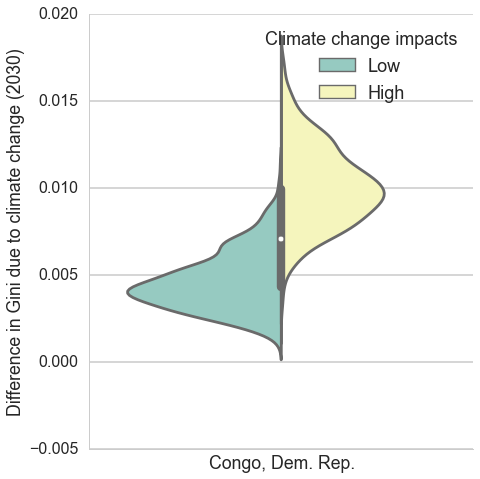

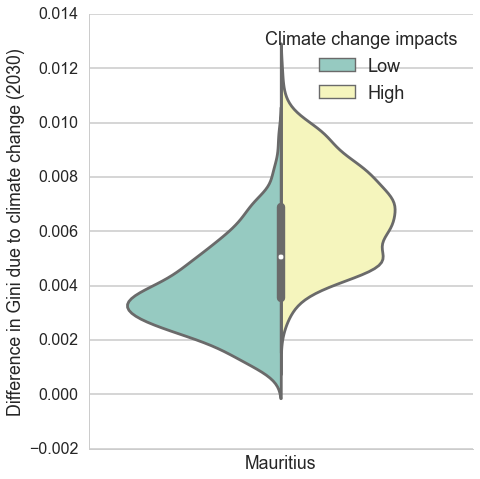

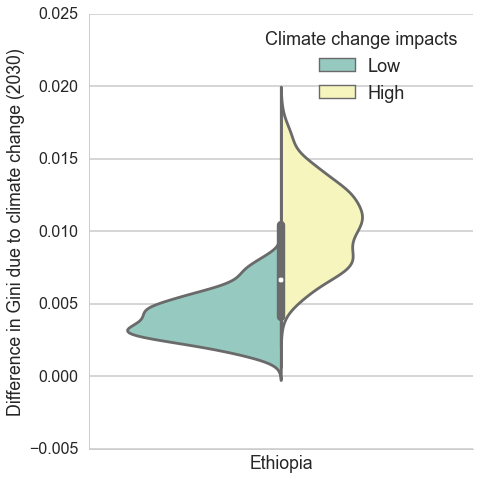

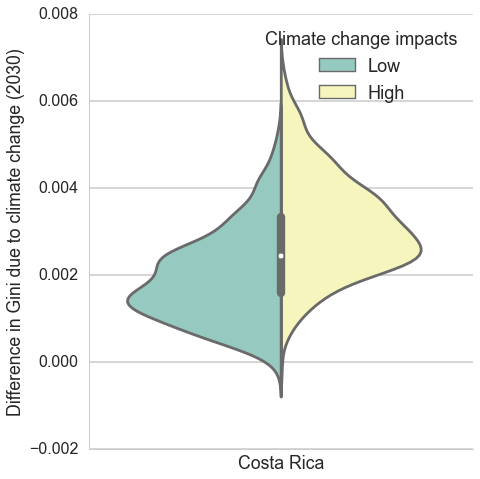

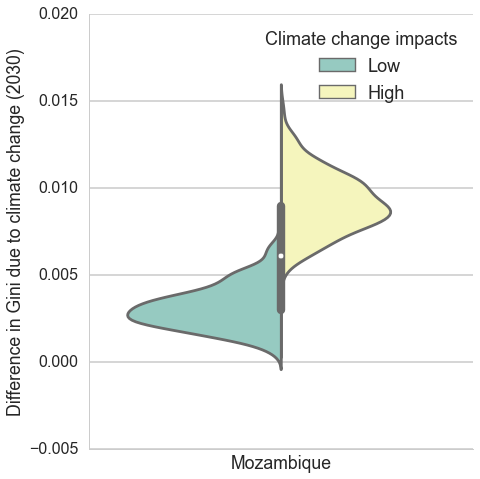

In [129]:
for country in drivers_country_gini.index:

    fig = plt.figure(figsize=(7,7))
    ax = fig.add_subplot(111)

    to_plot = hop.reset_index().ix[hop.reset_index().countryname==country,:]
    
    to_plot = to_plot.rename(columns=aa)
    
    firstdriver = drivers_country_gini.idxmax(axis=1).loc[country]
    
    to_plot["Climate change impacts"] = to_plot.ccint.replace(dict({0:'Low',1:'High'}))
    huedriver="Climate change impacts"

    sns.violinplot(x='countryname',y='ginidiff',data=to_plot,hue=huedriver,split=True,ax=ax,palette=p)
    ax.legend(title=huedriver,prop=font,loc=0)
    plt.xlabel(country)
    ax.get_xaxis().set_ticks([])
    #plt.title(country)
    plt.ylabel("Difference in Gini due to climate change (2030)")
    spine_and_ticks(ax)
    
    exclude = set(string.punctuation)
    s = ''.join(ch for ch in country if ch not in exclude)
    savefig("graphs_sept2016/gini/{}.png".format(s),bbox_inches="tight",dpi=300)

In [140]:
drivers_map = pd.Series(drivers_country_poor_pc.drop("Residual",axis=1).idxmax(axis=1),name='firstdriver')

In [141]:
drivers_map.unique()

array(['shareemp', 'issp5', 'ccint', 'shareag', 'b'], dtype=object)

In [142]:
drivers_numbers=pd.DataFrame(index=list(drivers_map.unique()))
drivers_numbers.loc['shareemp','number']=0
drivers_numbers.loc['issp5','number']=1
drivers_numbers.loc['shareag','number']=2
drivers_numbers.loc['ccint','number']=3
drivers_numbers.loc['b','number']=4

In [143]:
drivers_map_df = pd.concat([drivers_map,pd.Series(drivers_map.replace(drivers_numbers.number),name='number')],axis=1)

In [144]:
drivers_map_df = drivers_map_df.reset_index().rename(columns={'index':'countryname'})
drivers_map_df['iso'] = drivers_map_df.countryname.replace(codes.set_index("country_name").country)

In [145]:
drivers_map_df.sample(3)

,countryname,firstdriver,number,iso
71,Mauritania,issp5,1,MRT
16,Bangladesh,issp5,1,BGD
36,Bosnia and Herzegovina,shareemp,0,BIH


In [146]:
drivers_map_df.to_csv("drivers_map_poor_pc.csv",index=False)

In [ ]:
drivers_country_poor_pc['baseline']=drivers_country_poor_pc[['shareag', 'sharemanu', 'shareemp', 'grserv', 'grag', 'grmanu',
       'skillpserv', 'skillpag', 'skillpmanu', 'p', 'b', 'issp5']].sum(axis=1)
drivers_country_poor_pc['bau-dominant']=drivers_country_poor_pc.baseline>drivers_country_poor_pc.ccint

In [ ]:
drivers_country_poor_pc = drivers_country_poor_pc.reset_index().rename(columns={'index':'countryname'})
drivers_country_poor_pc['iso'] = drivers_country_poor_pc.countryname.replace(codes.set_index("country_name").country)
drivers_country_poor_pc.to_csv("bau_dominant_map_poor_pc.csv",index=False)

In [153]:
drivers_map_bau = pd.Series(drivers_abs_poor_baseline.drop("Residual",axis=1).idxmax(axis=1),name='firstdriver')

In [154]:
drivers_map_bau.unique()

array(['grserv', 'b', 'shareemp', 'issp5', 'grag', 'skillpserv'], dtype=object)

In [155]:
drivers_numbers=pd.DataFrame(index=list(drivers_map.unique()))
drivers_numbers.loc['shareemp','number']=0
drivers_numbers.loc['issp5','number']=1
drivers_numbers.loc['grag','number']=2
drivers_numbers.loc['skillpserv','number']=3
drivers_numbers.loc['b','number']=4
drivers_numbers.loc['grserv','number']=5

In [156]:
drivers_map_df = pd.concat([drivers_map_bau,pd.Series(drivers_map_bau.replace(drivers_numbers.number),name='number')],axis=1)
drivers_map_df = drivers_map_df.reset_index().rename(columns={'index':'countryname'})
drivers_map_df['iso'] = drivers_map_df.countryname.replace(codes.set_index("country_name").country)

drivers_map_df.to_csv("drivers_map_bau.csv",index=False)